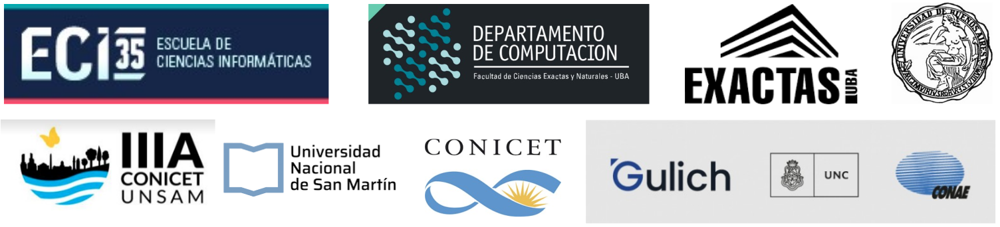
# Escuela de Ciencias Informáticas - 2022 - DC - FCEN - UBA
## Curso: Procesamiento de Imágenes Satelitales.  Docente: Rafael Grimson


---
#  Notebook 10: Aprendizaje supervisado. Clasificadores
---
Lo que veremos en esta notebook:

- [x] Imágenes (no satelitales). Las imágenes expresadas como array
- [x] Representación de una imagen en niveles de gris
- [x] Resolución de una imagen
---
Rasterio
propiedades de imagenes satelitales
visualizacion de una banda
visualización color, falso color
nequialize
algebra de bandas, indices

# El problema de la clasificación.
## Variable categórica
+ Sí - no
+ Infectado - no infectado
+ Varón - mujer - no binarix
+ Ceibo - Jacarandá - Lapacho - Eucalipto

-------------------------

* Variables explicativas x1, x2, x3, ...
* Variable a explicar *categórica*

In [ ]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import numpy as np
#from sklearn import datasets
from mpl_toolkits.mplot3d import Axes3D
from sklearn import datasets
import seaborn as sns
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn import metrics
from sklearn.neighbors import KNeighborsClassifier # para usar un modelo de clasificación KNN
from sklearn.tree import DecisionTreeClassifier
# from sklearn.metrics import accuracy_score,classification_report,confusion_matrix
from sklearn import tree
# import graphviz


-------------------------------


# Métodos de clasificación

+ A partir de los atributos (variables explicativas) determinan la etiqueta en la variable categórica Y.
+ Aprendizaje supervisado: contamos con un conjunto de entrenamiento en el cual conocemos las etiquetas - valores de la variable Y (a diferencia de Clustering).
+ Evaluación del modelo: relacionada con la cantidad de elementos bien o mal clasificados.
+ En el caso de las variables sí/no, hablamos de falsos positivos, o falsos negativos.

-------------------------------

# Métodos posibles

+ Frontera (x1 > c)
+ Regresión logística
+ Decision trees
+ Support Vector Machines (SVM)
+ K-Nearest Neighbors (KNN)

-------------------------------



# Dataset de árboles de parques de la Ciudad de Buenos Aires


Descripción de los datos.
Datos: ubicación (lat-lon), altura, diámetro, inclinación, nombre.
Diámetro es el diámetro del tronco a la altura de aprox 1.3m (Se le dice DAP por diámetro a la altura del pecho, donde pecho es el pecho humano).
Vamos a tomar como variable a explicar: la especie del árbol ('nombre_com').



In [ ]:
data_arboles = pd.read_csv('data/raw_data/Arboles_CABA_std.csv')

In [ ]:
data_arboles.columns

In [ ]:
data_arboles['especie'].value_counts()

In [ ]:
data_arboles.head()

In [ ]:
data_arboles = data_arboles[['especie', 'altura', 'diametro', 'inclinacion']]

In [ ]:
import seaborn as sns
sns.scatterplot(data=data_arboles, y='altura', x='diametro',hue='especie', alpha=0.3, s=15)

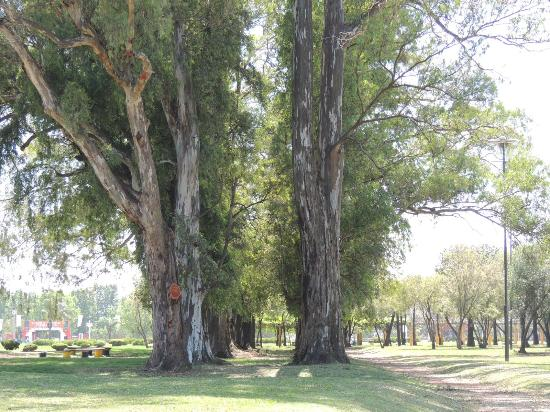

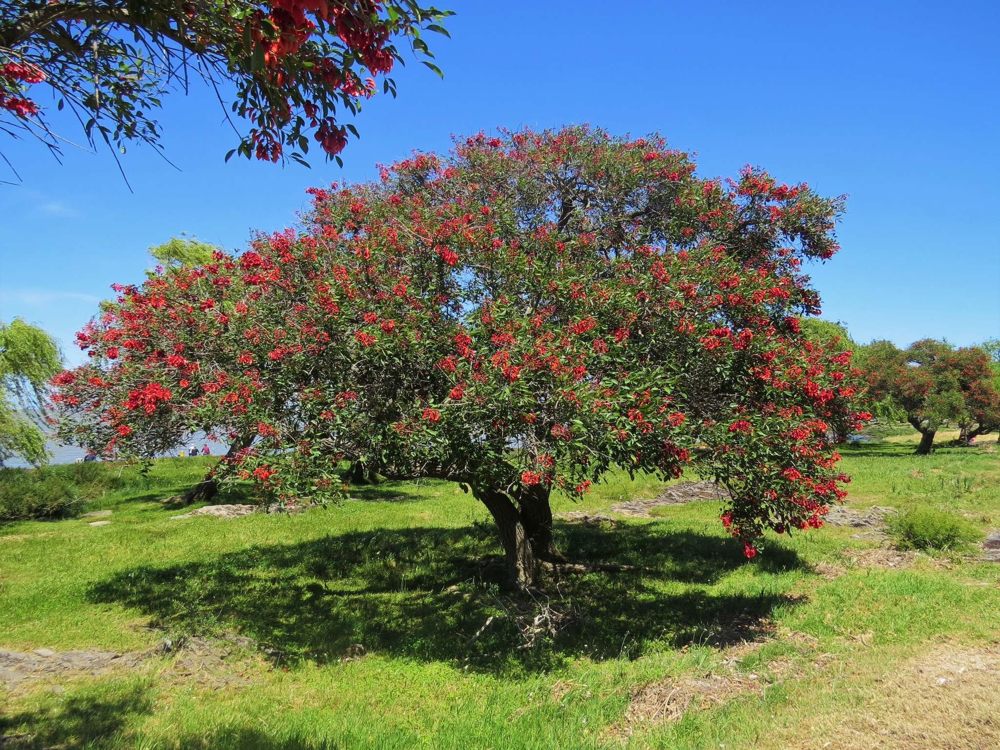

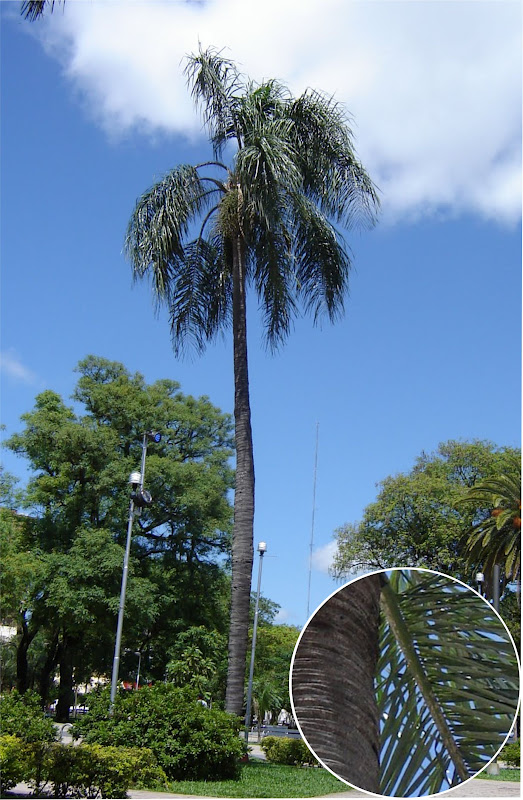

In [ ]:
sns.violinplot(data=data_arboles,x='especie', y='altura')

In [ ]:
sns.violinplot(data=data_arboles,x='especie', y='diametro')


In [ ]:
data_arboles.describe()

# Clasificadores
Separamos en X (variables explicativas) e Y (variable a explicar).

In [ ]:
X = data_arboles[['altura', 'diametro', 'inclinacion']].values
Y = data_arboles['especie'].values

## Un primer modelo: KNN

### Explicación del modelo de KNN. 

Dada una observación nueva, consideramos las `K` muestras etiquetadas más cercanas (`NN`) en el espacio de atributos. La clase asignada a esta nueva observación será la mayoritaria en el conjunto de vecinas.

In [ ]:
model = KNeighborsClassifier(n_neighbors = 1) # modelo en abstracto
model.fit(X, Y) # entreno el modelo con los datos X e Y
Y_pred = model.predict(X) # me fijo qué clases les asigna el modelo a mis datos

------------------

### ¿Cómo evaluamos nuestro clasificador?

## Matriz de confusión.

Para cada clase i, nos fijamos cuántas observaciones de la clase fueron clasificadas en cada clase j. Esto nos da una matriz cuadrada, con una fila y columna por cada clase.

In [ ]:
metrics.confusion_matrix(Y, Y_pred,labels=['Eucalipto', 'Pindó','Ceibo'])

## Exactitud o _accuracy_

Es una medida numérica que cuenta la proporción de observaciones bien clasificadas. Es decir: 
cantidad de observaciones bien clasificadas / cantidad total de observaciones.

In [ ]:

print("Exactitud del modelo:", metrics.accuracy_score(Y, Y_pred))

# Entrenamiento <-> Evaluación 
### ¿Cuál es el valor de n_neigbors que conviene usar?

¿Qué pasa con 1, 3, 5, 10, 50? ¿Cómo varía la exactitud? ¿Qué es lo que está pasando?

Tendríamos que evaluar el modelo en datos que NO se usaron para ajustarlo.

Separemos el dataset en train y test para una mejor evaluación.

In [ ]:
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size = 0.25) # 75% para train y 25% para test


In [ ]:
model = KNeighborsClassifier(n_neighbors = 3) # modelo en abstracto
model.fit(X_train, Y_train) # entreno el modelo con los datos X_train e Y_train
Y_pred = model.predict(X_test) # me fijo qué clases les asigna el modelo a mis datos X_test

In [ ]:
print("Exactitud del modelo:", metrics.accuracy_score(Y_test, Y_pred))

In [ ]:
metrics.confusion_matrix(Y_test, Y_pred,labels=['Eucalipto', 'Pindó','Ceibo'])

Ahora tenemos una idea más realista de cuán bien predice nuestro modelo.

## Estandarización de los datos

In [ ]:
sns.scatterplot(data=data_arboles, y='altura', x='diametro',hue='especie', alpha=0.3, s=15)

In [ ]:
from sklearn.preprocessing import StandardScaler
transformer = StandardScaler().fit(X)  # fit does nothing.
transformer.get_params()

In [ ]:
TX=transformer.transform(X)
X, TX

In [ ]:
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size = 0.25)
model = KNeighborsClassifier(n_neighbors = 3) # modelo en abstracto


model.fit(X_train, Y_train) # entreno el modelo con los datos X_train e Y_train
Y_pred = model.predict(X_test) # me fijo qué clases les asigna el modelo a mis datos X_test
print(f"Exactitud del modelo sobre los datos originales   : {metrics.accuracy_score(Y_test, Y_pred):.3f}")


model.fit(transformer.transform(X_train), Y_train) # entreno el modelo con los datos transformados X_train 
Y_pred = model.predict(transformer.transform(X_test)) # me fijo qué clases les asigna el modelo a mis datos transoformados
print(f"Exactitud del modelo sobre los datos transformados: {metrics.accuracy_score(Y_test, Y_pred):.3f}")

In [ ]:
TX=transformer.transform(X)

print("Datos originales")
sns.scatterplot(x=X[:,1],y=X[:,0],hue=Y)
plt.show()
print("Datos transformados")
sns.scatterplot(x=TX[:,1],y=TX[:,0],hue=Y)
plt.show()

In [ ]:
print(f"Altura original:     Media {X[:,0].mean():.2f}, desvío {X[:,0].std():.2f}")
print(f"Altura transformada: Media {TX[:,0].mean():.2f}, desvío {TX[:,0].std():.2f}")

----------------------------------
# Cross-validation

En este modelo de KNN, al igual que en muchos otros, hay un parámetro (en este caso n_neighbors) que le da al modelo mayor capacidad de adaptarse a las irregularidades o variabiliad de los datos. Cuando un modelo se adapta _demasiado_ a las variaciones de los datos, se da un _overfitting_. 

Para prevenir este fenómeno, podemos hacer cross-validation. Consiste en repetir muchas veces el experimento de separar los datos en train y test (como recién) y evaluar la predicción para cada valor de el/los parámetros. Luego promediamos y vemos cómo fue el desempeño promedio para cada elección del/los parámetros.


# K-folding
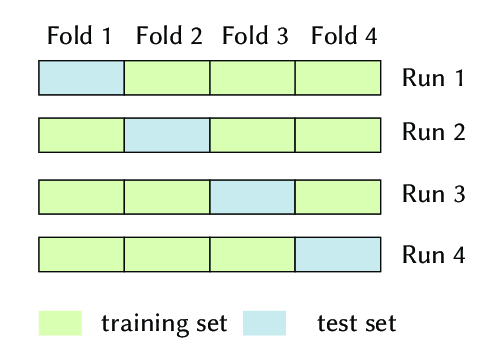



In [ ]:
n_splits = 25
from sklearn.model_selection import StratifiedKFold
skf = StratifiedKFold(n_splits=n_splits, shuffle=True)
print(skf)

In [ ]:
valores_K = range(1, 25)

resultados_train = np.zeros((n_splits, len(valores_K)))
resultados_test = np.zeros((n_splits, len(valores_K)))

split = 0
for train_index, test_index in skf.split(X,Y):
    print(split)
    X_train, X_test = X[train_index,:], X[test_index,:]
    Y_train, Y_test = Y[train_index], Y[test_index]    
    for k in valores_K:
        model = KNeighborsClassifier(n_neighbors = k) # modelo en abstracto
        model.fit(X_train, Y_train) 
        Y_pred = model.predict(X_test)
        Y_pred_train = model.predict(X_train)
        acc_test = metrics.accuracy_score(Y_test, Y_pred)
        acc_train = metrics.accuracy_score(Y_train, Y_pred_train)
        resultados_test[split, k-1] = acc_test
        resultados_train[split, k-1] = acc_train
    split += 1

In [ ]:
promedios_train = np.mean(resultados_train, axis = 0) 
promedios_test = np.mean(resultados_test, axis = 0) 

In [ ]:
promedios_test

In [ ]:
plt.plot(valores_K, promedios_train, label = 'Train')
plt.plot(valores_K, promedios_test, label = 'Test')
plt.legend()
plt.title('Exactitud del modelo de KNN')
plt.xlabel('K vecinos')
plt.ylabel('Exactitud (accuracy)')
plt.show()

## Un segundo modelo: árbol de decisión (decision tree)

### Explicación del modelo de árbol.

Por ejemplo: en cada punto hacemos una pregunta sobre un atributo (x1 < 3.4?) y según la respuesta se abren dos ramas del árbol. 

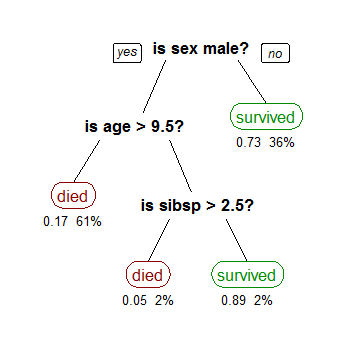

Nuevamente, podés consultar el Bishop o mirar [Wikipedia](https://es.wikipedia.org/wiki/Aprendizaje_basado_en_%C3%A1rboles_de_decisi%C3%B3n).

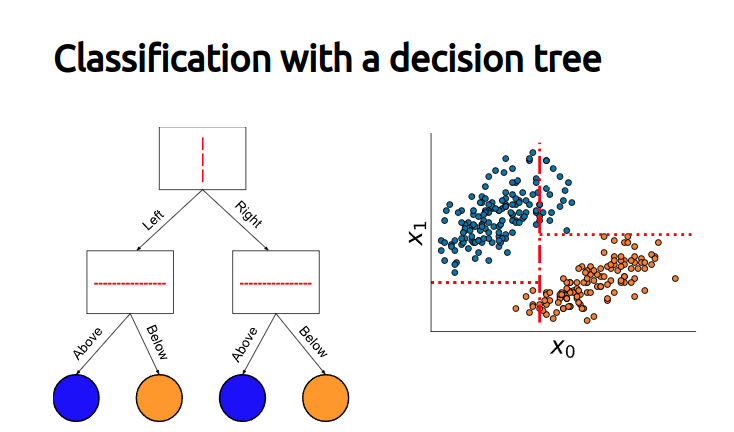 

In [ ]:
clf_model = DecisionTreeClassifier(max_depth = 2) # modelo en abstracto
clf_model.fit(X, Y) # entrenamos el modelo
Y_pred = clf_model.predict(X) # vemos cómo clasifica

In [ ]:
print("Exactitud del modelo:", metrics.accuracy_score(Y, Y_pred))
metrics.confusion_matrix(Y, Y_pred,labels=['Eucalipto', 'Pindó','Ceibo'])

In [ ]:
fn = ['altura', 'diametro', 'inclinacion']
cn = ['Ceibo', 'Eucalipto', 'Pindó']

In [ ]:
fig, axes = plt.subplots(nrows = 1, ncols = 1, figsize = (3,3), dpi = 300)

tree.plot_tree(clf_model,  feature_names = fn, class_names = cn, filled = True)
plt.show()

## Podemos probar con otros valores de max_depth y también evaluar con cross-validation.

In [ ]:
n_splits = 25
from sklearn.model_selection import StratifiedKFold
skf = StratifiedKFold(n_splits=n_splits, shuffle=True)
print(skf)

In [ ]:
valores_prof = range(1, 25)

resultados_test = np.zeros((n_splits, len(valores_prof)))
resultados_train = np.zeros((n_splits, len(valores_prof)))

split = 0
for train_index, test_index in skf.split(X,Y):
    for k in valores_prof:
        X_train, X_test = X[train_index,:], X[test_index,:]
        Y_train, Y_test = Y[train_index], Y[test_index]
        model = DecisionTreeClassifier(max_depth = k) # modelo en abstracto
        model.fit(X_train, Y_train) 
        Y_pred = model.predict(X_test)
        Y_pred_train = model.predict(X_train)
        acc_test = metrics.accuracy_score(Y_test, Y_pred)
        acc_train = metrics.accuracy_score(Y_train, Y_pred_train)
        resultados_test[split, k-1] = acc_test
        resultados_train[split, k-1] = acc_train
    split += 1

In [ ]:
promedios_train = np.mean(resultados_train, axis = 0) 
promedios_test = np.mean(resultados_test, axis = 0) 

plt.plot(valores_prof, promedios_train, label = 'Train')
plt.plot(valores_prof, promedios_test, label = 'Test')
plt.legend()
plt.title('Exactitud del modelo de árbol de decisión')
plt.xlabel('Profundidad del árbol')
plt.ylabel('Exactitud (accuracy)')
plt.show()

In [ ]:
print(f"El mejor promedio fue obtenido para profundidad {valores_prof[np.argmax(promedios_test)]} con una exactitud de {max(promedios_test):.3f}")

In [ ]:
valores_prof[np.argmax(promedios_test)]

In [ ]:
valores_prof

# Un modelo más: Random Forest

## Explicación del modelo.

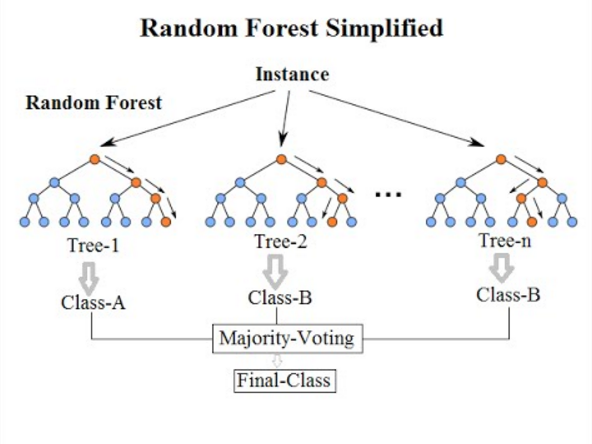


In [ ]:
#separo en train y test
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size = 0.25)

#entreno un modelo
clf = RandomForestClassifier(n_estimators = 100, max_depth = 12)
clf.fit(X_train, Y_train)

#lo evaluo
Y_pred = clf.predict(X_test)
print("Accuracy:", metrics.accuracy_score(Y_test, Y_pred))

In [ ]:
n_splits = 25
from sklearn.model_selection import StratifiedKFold
skf = StratifiedKFold(n_splits=n_splits, shuffle=True)
print(skf)

valores_prof = [7,8,9,10]
valores_estim = [100,120,150,180,200]

resultados_test = np.zeros((n_splits, len(valores_prof), len(valores_estim)))
resultados_train = np.zeros((n_splits, len(valores_prof), len(valores_estim)))

split = 0
for train_index, test_index in skf.split(X,Y):
    print(f"Fold {split + 1}:")
    for i,d in enumerate(valores_prof):
        print(f" - arboles de profundidad {d}")
        for j,n in enumerate(valores_estim):
            X_train, X_test = X[train_index,:], X[test_index,:]
            Y_train, Y_test = Y[train_index], Y[test_index]
            model = RandomForestClassifier(n_estimators = n, max_depth = d)
            model.fit(X_train, Y_train) 
            Y_pred = model.predict(X_test)
            Y_pred_train = model.predict(X_train)
            acc_test = metrics.accuracy_score(Y_test, Y_pred)
            acc_train = metrics.accuracy_score(Y_train, Y_pred_train)
            resultados_test[split, i, j] = acc_test
            resultados_train[split, i, j] = acc_train
    split += 1

In [ ]:
promedios_test = np.mean(resultados_test, axis = 0) 


In [ ]:
#plt.imshow(promedios_test)

fig, ax = plt.subplots()
im = ax.imshow(promedios_test)

# Show all ticks and label them with the respective list entries
#ax.set_yticks(np.arange(len(valores_prof)), labels=[str(v) for v in valores_prof])
#ax.set_xticks(np.arange(len(valores_estim)))#, labels=valores_estim)

In [ ]:
ind = np.unravel_index(np.argmax(promedios_test, axis=None), promedios_test.shape)
opt_d = valores_prof[ind[0]]
opt_n = valores_estim[ind[1]]
max_acc = promedios_test[ind]

print(f"El mejor promedio fue obtenido para profundidad {opt_d} y {opt_n} arboles, con una exactitud de {max_acc:.3f}")

# Clasificadores Parte 2 
# Clasificación Supervisada
# Aplicada a imágenes satelitales

In [ ]:
#Bibliotecas de Python
import geopandas as gpd
import numpy as np
import rasterio
from rasterio.mask import mask
from shapely.geometry import mapping
import matplotlib.pyplot as plt
from rasterio.plot import show

from funciones import *

from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
from sklearn.metrics import cohen_kappa_score as kappa


In [ ]:
#Levanto en X, Y los datos etiquetados, como antes

#Datos del raster y del shp
path_proc = 'data/proc/'
path_out = 'data/out/'
path_shp = 'data/raw_data/vector/'
raster_fn = path_proc + 'S2_dique_20181006.tif'
rois_shp = gpd.read_file(path_shp+'rois_dique3.geojson')

#Leo los ROIS
with rasterio.open(raster_fn) as src:
    d=src.count #cantidad de atributos = cantidad de bandas en el raster
    m=src.read()

nodata=-255 #elijo un valor raro para nodata

In [ ]:
show(nequalize(m[[2,1,0]]))

In [ ]:
clases=list(set(rois_shp['clase']))
clases.sort() #numero las clases de los ROIs alfabéticamente
clase_dict = {clase:i for i, clase in enumerate(clases)}

In [ ]:
#Preparo colección de atributos etiquetados. Comienza con 0 datos
X = np.zeros([0,d],dtype = np.float32) #array con todos los atributos
Y = np.zeros([0],dtype=int)            #array con sus etiquetas

with rasterio.open(raster_fn) as src:
    for index, row in rois_shp.iterrows():
        poli = row['geometry']
        clase = row['clase']
        clip, _transform = mask(src, [poli], crop=True,nodata=nodata)
        d,x,y = clip.shape
        D = list(clip.reshape([d,x*y]).T)
        D = [p for p in D if (not (p==nodata).prod())]
        DX = np.array(D)        
        DY = np.repeat(clase_dict[clase],len(D))
        X = np.concatenate((X,DX))
        Y = np.concatenate((Y,DY))

In [ ]:
#Clasifico
#Tres clasificadores: KNN, CLF, RF
#EXPLICAR El problema del overfitting.
#Train-Test split
#precision, Recall, Kappa
#

L = list(Y)
E = set(L)

pixels_por_clase = {clases[y]:L.count(y) for y in E}

In [ ]:
for clase in clases:
    print(f"{clase:>15s}: {pixels_por_clase[clase]}")
    

# Kappa index

Una medida de exactitud para clases desbalanceadas

El Coeficiente kappa de Cohen es una medida estadística de la exactitud de una clasificación que tiene en cuenta el desbalance entre la cantidad de elementos de las diferentes categorías. Es considreada una medida más robusta que el simple cálculo de la exactitud.

In [ ]:
ceros = np.zeros(100)
un_uno = ceros.copy()
un_uno[0] = 1
otro_uno = cero        geom_GJ = [mapping(geom_sh)]
s.copy()
otro_uno[1] = 1


In [ ]:
print(un_uno)
print(ceros)


acc = accuracy_score(un_uno, ceros)
print(f'accuracy: {acc:.3f}')

k = kappa(un_uno, ceros)
print(f'kappa index: {k:.3f}')


## Árboles de decisión 


In [ ]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(
    X, Y, stratify=Y, random_state=0)

In [ ]:
#Armamos y entrenamos un *Decision tree*
from sklearn import tree
clf = tree.DecisionTreeClassifier()
clf = clf.fit(X_train, y_train)
Y_pred = clf.predict(X_test)

In [ ]:
#Métricas
clases

In [ ]:
M=confusion_matrix(y_test, Y_pred)
print('Matriz de confusión:\n',M)

acc = accuracy_score(y_test, Y_pred)
print(f'accuracy: {acc:.2f}')

k = kappa(y_test, Y_pred)
print(f'kappa index: {k:.2f}')

#%%

### Armemos un arbol de profundidad 4 y lo estudiamos 

In [ ]:
#Armamos y entrenamos un arbol de prof 4

clf4 = DecisionTreeClassifier(max_depth = 4)
clf4 = clf4.fit(X_train, y_train)
Y_pred = clf4.predict(X_test)

acc = accuracy_score(y_test, Y_pred)
print(f'accuracy: {acc:.2f}')

k = kappa(y_test, Y_pred)
print(f'kappa index: {k:.2f}')

In [ ]:
#Imprimimos su estructura de arbol:
#(adaptado de la documentación sklearn)
#https://scikit-learn.org/stable/auto_examples/tree/plot_unveil_tree_structure.html

feature_names=['B','G','R','NIR','NDVI']
n_nodes = clf4.tree_.node_count
children_left = clf4.tree_.children_left
children_right = clf4.tree_.children_right
feature = clf4.tree_.feature
threshold = clf4.tree_.threshold
hojas = [clases[np.argmax(clf4.tree_.value[i][0])] for i in range(n_nodes)]

n_nodes

In [ ]:
node_depth = np.zeros(shape=n_nodes, dtype=np.int64)
is_leaves = np.zeros(shape=n_nodes, dtype=bool)
stack = [(0, 0)]  # start with the root node id (0) and its depth (0)
while len(stack) > 0:
    # `pop` ensures each node is only visited once
    node_id, depth = stack.pop()
    node_depth[node_id] = depth

    # If the left and right child of a node is not the same we have a split
    # node
    is_split_node = children_left[node_id] != children_right[node_id]
    # If a split node, append left and right children and depth to `stack`
    # so we can loop through them
    if is_split_node:
        stack.append((children_left[node_id], depth + 1))
        stack.append((children_right[node_id], depth + 1))
    else:
        is_leaves[node_id] = True

print("El árbol binario tiene una estructura con {n} nodos:\n".format(n=n_nodes))
for i in range(n_nodes):
    if is_leaves[i]:
        print("{space}N{node}: HOJA {clase}.".format(
            space=node_depth[i] * "\t", node=i, clase = hojas[i]))
    else:
        print("{space}N{node}: SI ({feature} <= {threshold:.3f}) -> N{left}, SINO -> N{right}.".format(
                  space=node_depth[i] * "\t",
                  node=i,
                  left=children_left[i],
                  feature=feature_names[feature[i]],
                  threshold=threshold[i],
                  right=children_right[i]))

In [ ]:
#%%
fig = plt.figure(figsize=(10,10),dpi=800)
_ = tree.plot_tree(clf4, 
                   feature_names=['B','G','R','NIR','NDVI'],  
                   class_names=clases,
                   filled=True)
plt.show()

# Selección de modelos
## Decision trees - selección de profundidad
Ojo con el overfitting

In [ ]:
#armamos una lista de maximas profundidades y vemos cual ajusta mejor
lmd = np.arange(2,25)
scoresTest = []
scoresTrain = []

for md in lmd:
    clf = tree.DecisionTreeClassifier(max_depth = md)
    clf = clf.fit(X_train, y_train)
    Y_pred = clf.predict(X_test)
    acc_test = accuracy_score(y_test, Y_pred)
    scoresTest.append(acc_test)
    acc_train = accuracy_score(y_train, clf.predict(X_train))
    scoresTrain.append(acc_train)
    print(f'Prof {md:>2d}: Train {acc_train:.3f}, Test: {acc_test:.3f}')

In [ ]:
#busco el mejor score en el train set
imx = np.argmax(scoresTest)
best_prof = lmd[imx]
acc = scoresTest[imx]
print(f'El mejor resultado en el conjunto de testeo fue obtenido para un árbol\nde profundidad {best_prof} con una exactitud de {acc:.3f}')

In [ ]:
#ploteo
plt.plot(lmd,scoresTest,label="Test")
plt.plot(lmd,scoresTrain,label="Train")
plt.title("Exactitud en función de la profundidad")    
plt.ylabel("Exactitud")
plt.xlabel("Profundidad del árbol de decisión")
plt.axvline(x=best_prof, label='Mejor profundidad', c='r')
plt.legend()
plt.show()

Ojo, todo esto depende de la partición TRAIN - TEST que hicimos al principio 

Si cambio la partición puede darme un resultado diferente

Veremos ahora un método un poco mas justo.

# K-folding
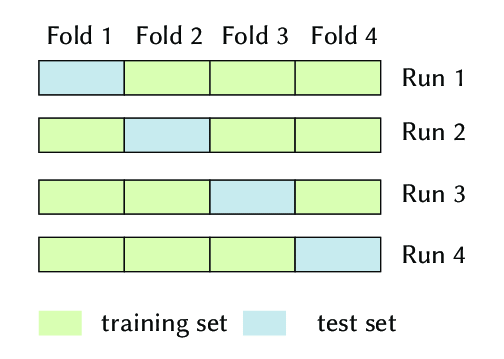
# K-folding estatificado
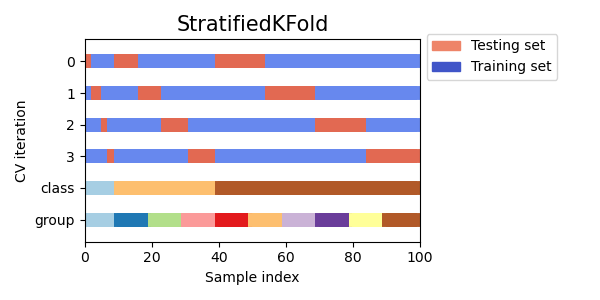


In [ ]:
from sklearn.model_selection import StratifiedKFold

n_splits = 5
lmd = np.arange(2,25)
accTest = np.zeros([len(lmd),n_splits])
accTrain = np.zeros([len(lmd),n_splits])

skf = StratifiedKFold(n_splits=n_splits, shuffle=True)
for j, (train_index, test_index) in enumerate(skf.split(X, Y)):
    print(f'fold {j+1} de {n_splits}.')
    X_train, X_test = X[train_index], X[test_index]
    y_train, y_test = Y[train_index], Y[test_index]
    for i,md in enumerate(lmd):
        clf = tree.DecisionTreeClassifier(max_depth = md)
        clf = clf.fit(X_train, y_train)
        accTest[i,j] = accuracy_score(y_test, clf.predict(X_test))
        accTrain[i,j] = accuracy_score(y_train, clf.predict(X_train))

In [ ]:
print(f'\n\nExactitud para cada max_depth (filas) y las {n_splits} corridas:\n')
print('*',' '.join([f'Corrida {i+1} ' for i in range(n_splits)]),'*')
print(accTest)

In [ ]:
for i in range(n_splits):
    plt.plot(lmd,accTest[:,i],label=f"Test{i}")
    plt.plot(lmd,accTrain[:,i],label=f"Train{i}",c='k')
plt.show()

In [ ]:
#Calculo promedios de los K folds
scoresTest = accTest.mean(axis=1)
scoresTrain = accTrain.mean(axis=1)

#Busco el mejor resultado
imx = np.argmax(scoresTest)
best_prof = lmd[imx]
best_acc = scoresTest[imx]
print(f'El mejor resultado en el conjunto de testeo fue obtenido para un arbol de profundidad {best_prof} y una exactitud de {best_acc:.3f}')

In [ ]:
#Grafico promedios
plt.plot(lmd,scoresTest,label="Test")
print(f'El mejor resultado fue con un árbol de profundidad {lmd[np.argmax(scoresTest)]}: {scoresTest[np.argmax(scoresTest)]:.3f}')
plt.plot(lmd,scoresTrain,label="Train")
plt.title("Exactitud en función de la profundidad")    
plt.ylabel("Exactitud mediana")
plt.xlabel("Profundidad del árbol de decisión")
plt.axvline(x=best_prof, label='Mejor profundidad', c='r')
plt.legend()
plt.show()

## Una vez seleccionado el modelo, lo entreno, y lo uso para clasificar todos los pixels de la imágen.

In [ ]:
#Entrenemos un arbol de profundidad 11
clf12 = tree.DecisionTreeClassifier(max_depth = 11)
clf12 = clf.fit(X, Y)

#Leo la imágen completa
raster_fn = path_proc + 'S2_dique_20181006.tif'
with rasterio.open(raster_fn) as src:
    img = src.read()
    crs = src.crs
    gt = src.transform
img.shape
d,x,y = img.shape

#y uso el modelo para clasificar toda la imagen
Y_pred = clf12.predict(img.reshape([d,x*y]).T)

# Muestro el resultado

In [ ]:
plt.figure(figsize=(26,20),dpi=300)
plt.imshow(Y_pred.reshape([x,y]),cmap='gnuplot2')
plt.show()
plt.figure(figsize=(26,20),dpi=300)
show(nequalize(img[[2,1,0]]))
plt.show()

In [ ]:
np.unique(Y_pred)

# Guardo el resultado en un GeoTIFF.

In [ ]:
#Guardo un resultado
class_img = Y_pred.reshape([x,y])
guardar_GTiff(path_out + 'Class_IMG_CLF12.tif',crs,gt,class_img)

# Ejercicios

## Ejercicio 10.1 K-Folding
1. Usar la técnica de K-Folding con 12 cortes (K=12) para seleccionar el número de vecinos (nuevamente K) en el algoritmo KNN.

In [ ]:
#Ejemplo de Random Forest
from sklearn.ensemble import RandomForestClassifier

forest = RandomForestClassifier()
forest.fit(X_train, y_train)
Y_pred = forest.predict(X_test)

#Métricas

M=confusion_matrix(y_test, Y_pred)
print(clases)
print(M)

acc = accuracy_score(y_test, Y_pred)
print(f'accuracy: {acc:.2f}')

k = kappa(y_test, Y_pred)
print(f'kappa index: {k:.2f}')

## Ejercicio 10.2 Ejercicio integrador con Random Forest
1. Usando los datos etiquetados en la clase anterior (con dos clases rurales), seleccioná los parámetros óptimos para un modelo Random Forest, entrenalo y guardá el resultado de clasificar todos los pixels en el recorte rectangular en el que trabajamos:
    1. Seleccioná un valor para el parámetro $max$_$depth$ (profundidad máxima de los árboles) usando KFolding en un bosque de 100 arboles. Graficá el kappa index obtenido (del conjunto de evaluación, Test) en función del parámetro.
    1. Seleccioná un valor para el parámetro $n$_$estimators$ (cantidad de árboles) usando KFolding para la profundidad seleccionada antes. Graficar el kappa index obtenido  en función del parámetro.
    1. Usá todos los datos etiquetados para entrenar el clasificador RF seleccionado y generá una imagen clasificada completa de nuestra zona de estudio. Guardala en el directorio `data/out/`.

